# Trigger Word Detection

In this Notebook, We will construct a speech dataset and implement an algorithm for trigger word detection.

* Trigger word detection is the technology that allows devices like Amazon Alexa, Google Home, and Apple Siri, to wake up upon hearing a certain word.  
* For this project, our trigger word will be "activate". Every time it hears the word "activate", it will make a "chiming" sound.

***This notebook was influenced by the deep learning specialization***

### Import packages

In [40]:
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from keras.models import load_model, Sequential, Model
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam
import IPython
import os
import random
from scipy.io import wavfile
from td_utils import *

Now Let's listen to the audios that we are going to use to construct our dataset

* In the raw_data directory, we can find a subset of the raw audio files of the positive words, negative words, and background noise. We will use these audio files to synthesize a dataset to train the model. 
    * The "activate" directory contains positive examples of people saying the word "activate". 
    * The "negatives" directory contains negative examples of people saying random words other than "activate". 
    * There is one word per audio recording. 
    * The "backgrounds" directory contains 10 second clips of background noise in different environments.

In [4]:
# Positive Example
IPython.display.Audio('/home/abdalla/Datasets/trigger/raw_data/activates/1.wav')

In [5]:
# Negative Example
IPython.display.Audio('/home/abdalla/Datasets/trigger/raw_data/negatives/1.wav')

In [6]:
# Background Example
IPython.display.Audio('/home/abdalla/Datasets/trigger/raw_data/backgrounds/1.wav')

We will use these three types of recordings (positives/negatives/backgrounds) to create a labeled dataset.

In [12]:
IPython.display.Audio("/home/abdalla/Datasets/trigger/audio_examples/example_train.wav")

### From Audio Recordings to Spectrograms

What really is an audio recording? 
* A microphone records little variations in air pressure over time, and it is these little variations in air pressure that your ear also perceives as sound. 
* You can think of an audio recording as a long list of numbers measuring the little air pressure changes detected by the microphone. 
* We will use audio sampled at 44100 Hz (or 44100 Hertz). 
    * This means the microphone gives us 44,100 numbers per second. 
    * Thus, a 10 second audio clip is represented by 441,000 numbers (= $10 \times 44,100$). 

##### Spectrogram
* It is quite difficult to figure out from this "raw" representation of audio whether the word "activate" was said. 
* In  order to help your sequence model more easily learn to detect trigger words, we will compute a *spectrogram* of the audio. 
* The spectrogram tells us how much different frequencies are present in an audio clip at any moment in time. 

Let's look at an example. 

In [13]:
IPython.display.Audio("/home/abdalla/Datasets/trigger/audio_examples/example_train.wav")

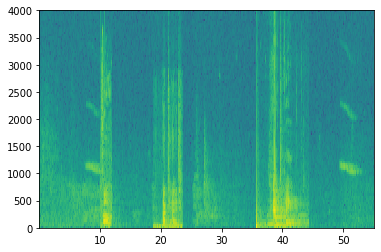

In [19]:
x = graph_spectrogram("/home/abdalla/Datasets/trigger/audio_examples/example_train.wav")

In [20]:
_, data = wavfile.read("/home/abdalla/Datasets/trigger/audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 5511)


In [22]:
# The number of time steps input to the model from the spectrogram
Tx = 5511

# Number of frequencies input to the model at each time step of the spectrogram
n_freq = 101

# The number of time steps in the output of our model
Ty = 1375 

### Generating a Single Training Example

Because speech data is hard to acquire and label, We will synthesize our training data using the audio clips of activates, negatives, and backgrounds. 

* To synthesize a single training example, we will:
    - Pick a random 10 second background audio clip
    - Randomly insert 0-4 audio clips of "activate" into this 10 sec. clip
    - Randomly insert 0-2 audio clips of negative words into this 10 sec. clip
* Because we had synthesized the word "activate" into the background clip, we know exactly when in the 10 second clip the "activate" makes its appearance.  

In [24]:
# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio('/home/abdalla/Datasets/trigger/raw_data/')

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
1741 

activate[1] len: different `activate` clips can have different lengths
2392 



#### Overlaying positive/negative 'word' audio clips on top of the background audio

* Given a 10 second background clip and a short audio clip containing a positive or negative word, we need to be able to "add" the word audio clip on top of the background audio.
* we will be inserting multiple clips of positive/negative words into the background. 
    * To ensure that the 'word' audio segments do not overlap when inserted, we will keep track of the times of previously inserted audio clips. 
* To be clear, when we insert a 1 second "activate" onto a 10 second clip of cafe noise, **we do not end up with an 11 sec clip.** 
    * The resulting audio clip is still 10 seconds long.

#### Label the positive/negative words
* The labels $y^{\langle t \rangle}$ represent whether or not someone has just finished saying "activate". 
    * $y^{\langle t \rangle} = 1$ when that clip has finished saying "activate".
    * Given a background clip, we can initialize $y^{\langle t \rangle}=0$ for all $t$, since the clip doesn't contain any "activate". 
* When we insert or overlay an "activate" clip, we will also update labels for $y^{\langle t \rangle}$.
    * Rather than updating the label of a single time step, we will update 50 steps of the output to have target label 1. 
    * We will update several consecutive time steps to make the training data more balanced.
* we will train a GRU (Gated Recurrent Unit) to detect when someone has **finished** saying "activate". 

### Helper Functions

In [25]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Inputs:
        segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")

    Returns:
        segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms) 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [26]:
def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Inputs:
        segment_time -- a tuple of (segment_start, segment_end) for the new segment
        previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
        True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    # Initialize overlap as a "False" flag.
    overlap = False
    
    # Sloop over the previous_segments start and end times.
    # Compare start/end times and set the flag to True if there is an overlap
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end and segment_end >= previous_start :
            overlap = True
            break

    return overlap

In [27]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Inputs:
        background -- a 10 second background audio recording.  
        audio_clip -- the audio clip to be inserted/overlaid. 
        previous_segments -- times where audio segments have already been placed
    
    Returns:
        new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    
    # Pick a random time segment onto which to insert the new audio clip.
    segment_time = get_random_time_segment(segment_ms)
    
    # Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap.
    
    retry = 5
    
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
        
    # if last try is not overlaping, insert it to the background
    if not is_overlapping(segment_time, previous_segments):
        
        # Append the new segment_time to the list of previous_segment
        previous_segments.append(segment_time)

        # Superpose audio segment and background
        new_background = background.overlay(audio_clip, position = segment_time[0])
    else:
        new_background = background
        segment_time = (10000, 10000)
    
    return new_background, segment_time

In [30]:
def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1.
    
    Inputs:
        y -- numpy array of shape (1, Ty), the labels of the training example
        segment_end_ms -- the end time of the segment in ms
    
    Returns:
        y -- updated labels
    """
    
    _, Ty = y.shape
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    if segment_end_y < Ty:
        # Add 1 to the correct index in the background label (y)
        for i in range(segment_end_y+1, segment_end_y+51):
            if i < Ty:
                y[0, i] = 1
    
    return y

In [66]:
def create_training_example(background, activates, negatives, Ty):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Inputs:
        background -- a 10 second background audio recording
        activates -- a list of audio segments of the word "activate"
        negatives -- a list of audio segments of random words that are not "activate"
        Ty -- The number of time steps in the output

    Returns:
        x -- the spectrogram of the training example
        y -- the label at each time step of the spectrogram
    """
    
    # Make background quieter
    background = background - 20

    # Initialize y of zeros
    y = np.zeros((1,Ty))

    # Initialize segment times as empty list
    previous_segments = []
    
    # Select 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    # Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates: # @KEEP
        
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time[0], segment_time[1]
        
        # Insert labels in "y" at segment_end
        y = insert_ones(y, segment_end)

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    # Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives: # @KEEP
        
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

In [34]:
IPython.display.Audio("train.wav")

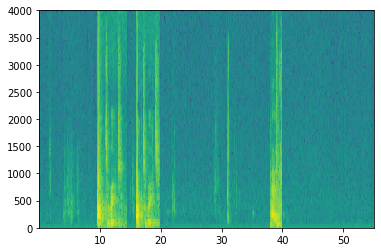

In [36]:
# Set the random seed
np.random.seed(18)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

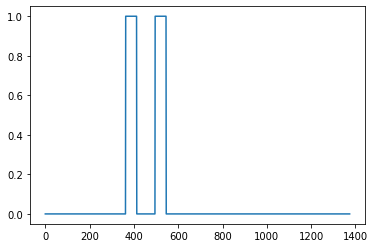

In [37]:
plt.plot(y[0])

0
10
20
30


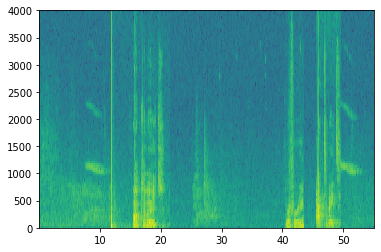

In [38]:
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

In [39]:
# Dev set
X_dev = np.load("/home/abdalla/Datasets/trigger/XY_dev/X_dev.npy")
Y_dev = np.load("/home/abdalla/Datasets/trigger/XY_dev/Y_dev.npy")

### Create the Model

In [46]:
def modelf(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Inputs:
        input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
        model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    
    X = Conv1D(196, kernel_size=15, strides=4)(X_input)
    
    X = BatchNormalization()(X)
    
    X = Activation('relu')(X)
    
    X = Dropout(0.8)(X)                                  

    X = GRU(128, return_sequences=True)(X)
    
    X = Dropout(0.8)(X)

    X = BatchNormalization()(X)                           
    
    X = GRU(128, return_sequences=True)(X)

    X = Dropout(0.8)(X)       

    X = BatchNormalization()(X)

    X = Dropout(0.8)(X)                                 
    
    # TimeDistributed  with sigmoid activation 
    X = TimeDistributed(Dense(1, activation='sigmoid'))(X) 

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [53]:
model = modelf(input_shape = (Tx, n_freq))
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 5511, 101)]       0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 1375, 196)         297136    
_________________________________________________________________
batch_normalization_6 (Batch (None, 1375, 196)         784       
_________________________________________________________________
activation_2 (Activation)    (None, 1375, 196)         0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 1375, 196)         0         
_________________________________________________________________
gru_4 (GRU)                  (None, 1375, 128)         125184    
_________________________________________________________________
dropout_9 (Dropout)          (None, 1375, 128)         0   

In [54]:
# opt = Adam(lr=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=["accuracy"])

In [55]:
model.fit(X, Y, batch_size = 64, epochs=100)

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 1.3147 - accuracy: 0.5019
Epoch 2/100
1/1 [==============================] - 2s 2s/step - loss: 1.2458 - accuracy: 0.5023
Epoch 3/100
1/1 [==============================] - 2s 2s/step - loss: 1.1709 - accuracy: 0.5056
Epoch 4/100
1/1 [==============================] - 2s 2s/step - loss: 1.1019 - accuracy: 0.5107
Epoch 5/100
1/1 [==============================] - 2s 2s/step - loss: 1.0395 - accuracy: 0.5135
Epoch 6/100
1/1 [==============================] - 2s 2s/step - loss: 1.0073 - accuracy: 0.5176
Epoch 7/100
1/1 [==============================] - 2s 2s/step - loss: 0.9905 - accuracy: 0.5475
Epoch 8/100
1/1 [==============================] - 2s 2s/step - loss: 0.9803 - accuracy: 0.5692
Epoch 9/100
1/1 [==============================] - 2s 2s/step - loss: 0.9587 - accuracy: 0.6008
Epoch 10/100
1/1 [==============================] - 2s 2s/step - loss: 0.9481 - accuracy: 0.6273
Epoch 11/100
1/1 [=====================

1/1 [==============================] - 2s 2s/step - loss: 0.5731 - accuracy: 0.8867
Epoch 86/100
1/1 [==============================] - 3s 3s/step - loss: 0.5709 - accuracy: 0.8892
Epoch 87/100
1/1 [==============================] - 2s 2s/step - loss: 0.5591 - accuracy: 0.8889
Epoch 88/100
1/1 [==============================] - 2s 2s/step - loss: 0.5566 - accuracy: 0.8912
Epoch 89/100
1/1 [==============================] - 2s 2s/step - loss: 0.5587 - accuracy: 0.8878
Epoch 90/100
1/1 [==============================] - 2s 2s/step - loss: 0.5560 - accuracy: 0.8893
Epoch 91/100
1/1 [==============================] - 3s 3s/step - loss: 0.5491 - accuracy: 0.8907
Epoch 92/100
1/1 [==============================] - 3s 3s/step - loss: 0.5449 - accuracy: 0.8918
Epoch 93/100
1/1 [==============================] - 3s 3s/step - loss: 0.5404 - accuracy: 0.8906
Epoch 94/100
1/1 [==============================] - 3s 3s/step - loss: 0.5446 - accuracy: 0.8896
Epoch 95/100
1/1 [=========================

In [60]:
loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 0s 427ms/step - loss: 0.2861 - accuracy: 0.9313
Dev set accuracy =  0.9312872886657715


### Test The model

In [61]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [62]:
chime_file = "/home/abdalla/Datasets/trigger/audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Step 2: Loop over the output steps in the y
    for i in range(Ty):
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold and more than 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

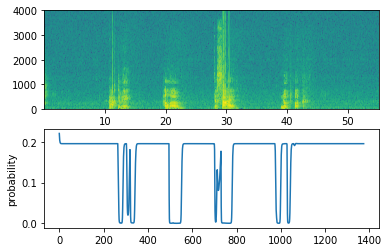

In [63]:
filename = "/home/abdalla/Datasets/trigger/raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

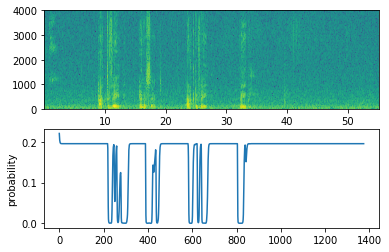

In [64]:
filename  = "/home/abdalla/Datasets/trigger/raw_data/dev/2.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")

# DONE :D